In [ ]:
# imports
import time
import math
import json
import pickle
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython import display as i_display

# plotting options
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
plt.rcParams['figure.figsize']=(23,15)


# constants
months = {'JAN':1, 'FEB':2, 'MAR':3, 'APR':4, 'MAY':5, 'JUN':6, 'JUL':7, 'AUG':8, 'SEP':9, 'OCT':10, 'NOV':11, 'DEC':12}

## <u><i>PREPROCESSING</i></u>

In [ ]:
# get processed df
def get_df():
    df = pd.read_csv('problem_1.csv')
    df.head()
    
    parts = df["Booking_Date"].str.split("-", n = 3, expand = True)
    df.head()
    arr = df.to_numpy()

    # separate date of order

    # old method
    # df["year"]= parts[2].astype('int')
    # df["month"]= parts[1].astype('int')

    # new method
    df["month"] = df["Fiscal Month"].str[0:3].astype(str).map(months).astype(int)
    df["year"] = df["Fiscal Month"].str[6:].astype(int)

    df["Fiscal Month"] = df["Fiscal Month"].apply(lambda x: f'{months[x[0:3]]}-{int("20"+x[-2]+x[-1])}')
    df["Fiscal Month"] = pd.to_datetime(df["Fiscal Month"], format="%m-%Y")
    df["fiscal_date"] = df["Fiscal Month"]
    df["quarter"] = df['Fiscal Month'].dt.quarter

    # df["booking_date"] = df["Booking_Date"].astype(str)
    df["booking_date"] = pd.to_datetime(df["Booking_Date"], format="%d-%m-%Y")

    df['prod_info'] = df['Business Unit'] + df['Product Family'] + df['PLID']

    df["booked_qty"] = df["Booked_Qty"]

    # replace features with numbers
    df['business_unit'], business_unit_u = pd.factorize(df['Business Unit'])
    df['product_family'], product_family_u = pd.factorize(df['Product Family'])
    df['plid'] = df['PLID']
    # df['plid'], plid_u = pd.factorize(df['PLID'])

    # add features
    # -------------------------------------------------------------------------------------
    # feature 1 [mean change across last]
    df["mean_across_quarter"] = df.groupby(['plid', 'quarter', 'year'], as_index=False).agg({'booked_qty': 'mean'})['booked_qty']

    # feature 2 [percentage change in feature 1]
    df['percentage_mean_change'] = df.groupby(['plid', 'quarter', 'year'])['mean_across_quarter'].pct_change()

    # fill Na's
    df["mean_across_quarter"] = df["mean_across_quarter"].fillna(0)
    df["percentage_mean_change"] = df["percentage_mean_change"].fillna(0)

    feature_df = df[["mean_across_quarter","percentage_mean_change"]]
    feature_array = feature_df.to_numpy(dtype = 'float64')
    inf_array = np.isinf(feature_array)
    feature_array = np.where(inf_array, 0, feature_array)
    feature_df = pd.DataFrame(feature_array, columns = ["mean_across_quarter","percentage_mean_change"])
    # -------------------------------------------------------------------------------------
    df["mean_across_quarter"] = feature_df["mean_across_quarter"]
    df["percentage_mean_change"] = feature_df["percentage_mean_change"]
    # -------------------------------------------------------------------------------------

    df['plid'], plid_u = pd.factorize(df['PLID'])

    # print results
    print("Unique values per feature:")
    print("  Business Units:", df['business_unit'].nunique())
    print("  Product Families:", df['product_family'].nunique())
    print("  PLIDs:", df['plid'].nunique())
    print("  Years:", df['year'].nunique())
    print("  Months:", df['month'].nunique())
    print(list(df['year'].unique()))

    # store numerifications into json
    f = open("numerifications.json", 'w')
    d = {"Business Unit": {}, "Product Family": {}, "PLID": {}}

    for i, x in enumerate(business_unit_u):
        d["Business Unit"][i] = x

    for i, x in enumerate(product_family_u):
        d["Product Family"][i] = x

    for i, x in enumerate(plid_u):
        d["PLID"][i] = x

    json.dump(d, f, indent = 4)
    f.close()

    # remove old features
    df.drop('Fiscal Quarter', inplace=True, axis=1)
    df.drop('Business Unit', inplace=True, axis=1)
    df.drop('PLID', inplace=True, axis=1)
    df.drop('Fiscal Month', inplace=True, axis=1)
    df.drop('prod_info', inplace=True, axis=1)
    df.drop('Product Family', inplace=True, axis=1)
    df.drop('Booking_Date', inplace=True, axis=1)
    df.drop('Booked_Qty', inplace=True, axis=1)

    data = df.copy()
    df.head()
    
    return data

In [ ]:
# load the data frame
df = get_df()
df.head()

Unique values per feature:
  Business Units: 18
  Product Families: 73
  PLIDs: 250
  Years: 9
  Months: 12
[2022, 2002, 2008, 2007, 2011, 2012, 2015, 2014, 2013]


,month,year,fiscal_date,quarter,booking_date,booked_qty,business_unit,product_family,plid,mean_across_quarter,percentage_mean_change
0,8,2022,2022-08-01,3,2016-08-01,204,0,0,0,8.666667,0.000000
1,10,2022,2022-10-01,4,2016-10-01,564,0,0,0,505.000000,0.000000
2,9,2022,2022-09-01,3,2016-09-01,1476,0,0,0,12.333333,0.423077
3,8,2002,2002-08-01,3,2017-08-01,374,0,0,0,73.500000,0.000000
4,10,2002,2002-10-01,4,2017-10-01,6094,0,0,0,193.500000,0.000000


## <u><i>TRAINING [RANDOM FOREST REGRESSOR]</i></u>

In [ ]:
# imports
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
# Split the data into training and test sets
train_data, test_data = train_test_split(df, test_size=0.2, shuffle=True, random_state=42)

# Train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=1000, random_state=42)
features = ["mean_across_quarter", 'percentage_mean_change']

In [ ]:
rf_model.fit(train_data[features], train_data['booked_qty'])

RandomForestRegressor(n_estimators=1000, random_state=42)

In [ ]:

# Evaluate the performance of the model on the test data
test_predictions = rf_model.predict(test_data[features])
mae = mean_absolute_error(test_data['booked_qty'], test_predictions)
rmse = mean_squared_error(test_data['booked_qty'], test_predictions, squared=False)
print('MAE: {:.2f}'.format(mae))
print('RMSE: {:.2f}'.format(rmse))

MAE: 9192.67
RMSE: 18181.26


## <u><i>TRAINING [LSTM]</i></u>

In [ ]:
df.reset_index()
df.head()

,month,year,fiscal_date,quarter,booking_date,booked_qty,business_unit,product_family,plid,mean_across_quarter,percentage_mean_change
0,8,2022,2022-08-01,3,2016-08-01,204,0,0,0,8.666667,0.000000
1,10,2022,2022-10-01,4,2016-10-01,564,0,0,0,505.000000,0.000000
2,9,2022,2022-09-01,3,2016-09-01,1476,0,0,0,12.333333,0.423077
3,8,2002,2002-08-01,3,2017-08-01,374,0,0,0,73.500000,0.000000
4,10,2002,2002-10-01,4,2017-10-01,6094,0,0,0,193.500000,0.000000


<Axes: xlabel='booking_date', ylabel='booked_qty'>

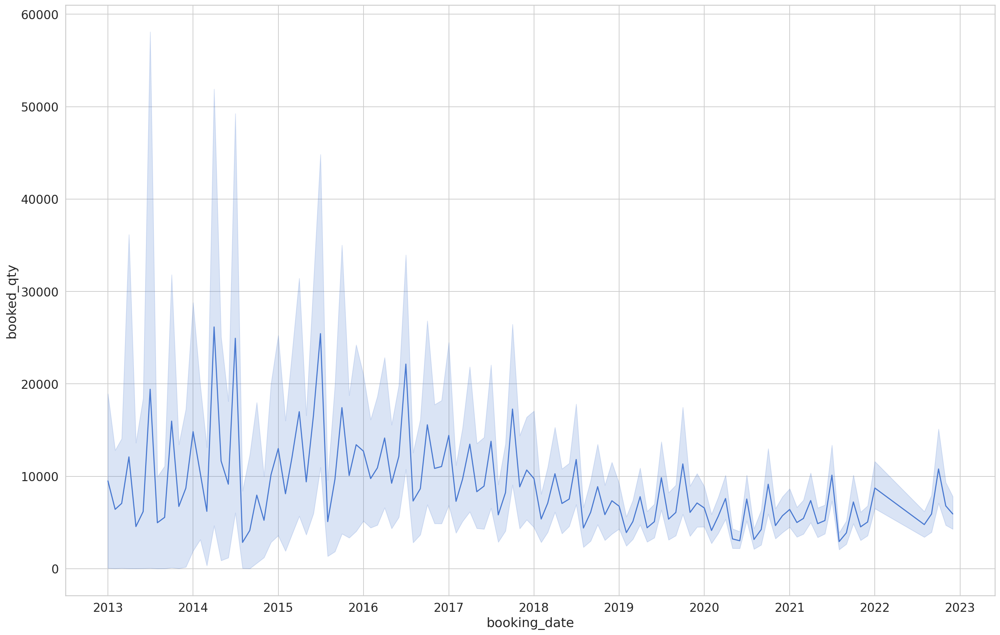

In [ ]:
sns.lineplot(x=df["booking_date"], y="booked_qty", data=df)

## <u><i>TRAINING [PROPHET]</i></u>

In [ ]:
df.tail()

,month,year,fiscal_date,quarter,booking_date,booked_qty,business_unit,product_family,plid,mean_across_quarter,percentage_mean_change
10991,6,2011,2011-06-01,2,2020-06-01,229,17,72,249,0.0,0.0
10992,5,2011,2011-05-01,2,2020-05-01,289,17,72,249,0.0,0.0
10993,7,2012,2012-07-01,3,2021-07-01,1231,17,72,249,0.0,0.0
10994,6,2012,2012-06-01,2,2021-06-01,591,17,72,249,0.0,0.0
10995,5,2012,2012-05-01,2,2021-05-01,601,17,72,249,0.0,0.0


In [ ]:
# imports
# !pip install prophet
from prophet import Prophet

In [ ]:
# uniques
no_products = df["plid"].nunique()
no_fams = df["product_family"].nunique()
no_business_units = df["business_unit"].nunique()
print("unique products:", no_products)
print("unique families:", no_fams)
print("unique business units:", no_business_units)

unique products: 250
unique families: 73
unique business units: 18


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/1ybjsczx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/810r3vvt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6897', 'data', 'file=/tmp/tmpxym0k5sl/1ybjsczx.json', 'init=/tmp/tmpxym0k5sl/810r3vvt.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelvigapohe/prophet_model-20230325172842.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:28:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (151, 2)
after mean: (79, 2)


17:28:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/c0t7z4o1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/je75ykq8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80313', 'data', 'file=/tmp/tmpxym0k5sl/c0t7z4o1.json', 'init=/tmp/tmpxym0k5sl/je75ykq8.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model94cfannv/prophet_model-20230325172843.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:28:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cm

before mean: (69, 2)
after mean: (24, 2)


INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 22.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/aakhq06f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/6xvf8xnt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31538', 'data', 'file=/tmp/tmpxym0k5sl/aakhq06f.json', 'init=/tmp/tmpxym0k5sl/6xvf8xnt.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeljtl9thth/prophet_model-20230325172844.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:28:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (157, 2)
after mean: (29, 2)


17:28:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/5sh888t5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/h6jep2dq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16518', 'data', 'file=/tmp/tmpxym0k5sl/5sh888t5.json', 'init=/tmp/tmpxym0k5sl/h6jep2dq.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeljetzje9l/prophet_model-20230325172844.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:28:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (250, 2)
after mean: (43, 2)


17:28:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/r_niwl6f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/pzrm0riy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50425', 'data', 'file=/tmp/tmpxym0k5sl/r_niwl6f.json', 'init=/tmp/tmpxym0k5sl/pzrm0riy.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeltabu2i6v/prophet_model-20230325172845.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:28:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (261, 2)
after mean: (74, 2)


17:28:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/u25nvnrr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/cxqzoc8h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73756', 'data', 'file=/tmp/tmpxym0k5sl/u25nvnrr.json', 'init=/tmp/tmpxym0k5sl/cxqzoc8h.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model27ana_99/prophet_model-20230325172846.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:28:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (57, 2)
after mean: (57, 2)


17:28:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 15.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/em_ghxcx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/xabr1kbx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=447', 'data', 'file=/tmp/tmpxym0k5sl/em_ghxcx.json', 'init=/tmp/tmpxym0k5sl/xabr1kbx.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model4fv3wbps/prophet_model-20230325172847.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:28:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmds

before mean: (21, 2)
after mean: (21, 2)


17:29:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/h3zfmalj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/oqqu4euz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59008', 'data', 'file=/tmp/tmpxym0k5sl/h3zfmalj.json', 'init=/tmp/tmpxym0k5sl/oqqu4euz.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelj8hr67zw/prophet_model-20230325172903.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (53, 2)
after mean: (53, 2)


17:29:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_z6npxds.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/xg0aqpub.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31582', 'data', 'file=/tmp/tmpxym0k5sl/_z6npxds.json', 'init=/tmp/tmpxym0k5sl/xg0aqpub.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelupv1si5f/prophet_model-20230325172904.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (100, 2)
after mean: (56, 2)


17:29:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/8hr4sxqz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/ixv6y80s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14230', 'data', 'file=/tmp/tmpxym0k5sl/8hr4sxqz.json', 'init=/tmp/tmpxym0k5sl/ixv6y80s.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelz5k9q1c0/prophet_model-20230325172906.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (122, 2)
after mean: (56, 2)


17:29:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/2snw5ohg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/2o8dfb5y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60420', 'data', 'file=/tmp/tmpxym0k5sl/2snw5ohg.json', 'init=/tmp/tmpxym0k5sl/2o8dfb5y.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model8j68v5kn/prophet_model-20230325172907.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (538, 2)
after mean: (37, 2)


17:29:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 7.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/kudpz6il.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/g9r84n8g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98306', 'data', 'file=/tmp/tmpxym0k5sl/kudpz6il.json', 'init=/tmp/tmpxym0k5sl/g9r84n8g.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeljn4935jh/prophet_model-20230325172908.csv', 'method=optimize

before mean: (11, 2)
after mean: (11, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/qftqv11l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_e0igk4l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2450', 'data', 'file=/tmp/tmpxym0k5sl/qftqv11l.json', 'init=/tmp/tmpxym0k5sl/_e0igk4l.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelklw8aq1h/prophet_model-20230325172908.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (325, 2)
after mean: (55, 2)


17:29:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/nihdlc3m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/6xyzhdw_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79809', 'data', 'file=/tmp/tmpxym0k5sl/nihdlc3m.json', 'init=/tmp/tmpxym0k5sl/6xyzhdw_.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model17jelyar/prophet_model-20230325172909.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (55, 2)
after mean: (55, 2)


17:29:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_ut0rs5v.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/0bet8ifz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50726', 'data', 'file=/tmp/tmpxym0k5sl/_ut0rs5v.json', 'init=/tmp/tmpxym0k5sl/0bet8ifz.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelzg60l27l/prophet_model-20230325172910.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (35, 2)
after mean: (35, 2)


17:29:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 7.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_whm__bg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/ogpi_h7_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76525', 'data', 'file=/tmp/tmpxym0k5sl/_whm__bg.json', 'init=/tmp/tmpxym0k5sl/ogpi_h7_.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model025y3ods/prophet_model-20230325172911.csv', 'method=optimize

before mean: (11, 2)
after mean: (11, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 21.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/0s0dl2zo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/fpxagq4e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68852', 'data', 'file=/tmp/tmpxym0k5sl/0s0dl2zo.json', 'init=/tmp/tmpxym0k5sl/fpxagq4e.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model68fxjgzf/prophet_model-20230325172912.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (28, 2)
after mean: (28, 2)


17:29:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 19.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/sy45y6zk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/9gsf4u9v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2546', 'data', 'file=/tmp/tmpxym0k5sl/sy45y6zk.json', 'init=/tmp/tmpxym0k5sl/9gsf4u9v.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelebi05ht1/prophet_model-20230325172912.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmd

before mean: (32, 2)
after mean: (25, 2)


17:29:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/y9em5wsv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/zgt52mos.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4964', 'data', 'file=/tmp/tmpxym0k5sl/y9em5wsv.json', 'init=/tmp/tmpxym0k5sl/zgt52mos.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeljw4qz4s3/prophet_model-20230325172913.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (366, 2)
after mean: (95, 2)


17:29:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/d7tny1wt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/135nnoab.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=10779', 'data', 'file=/tmp/tmpxym0k5sl/d7tny1wt.json', 'init=/tmp/tmpxym0k5sl/135nnoab.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelaqm2oxil/prophet_model-20230325172914.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cm

before mean: (82, 2)
after mean: (31, 2)


17:29:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/mt47zuva.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/ztflfh0x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=15936', 'data', 'file=/tmp/tmpxym0k5sl/mt47zuva.json', 'init=/tmp/tmpxym0k5sl/ztflfh0x.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model0jl2nezl/prophet_model-20230325172915.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (193, 2)
after mean: (55, 2)


17:29:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
/usr/local/lib/python3.9/dist-packages/prophet/plot.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/uffjm_pq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_pfecwve.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/

before mean: (68, 2)
after mean: (34, 2)


17:29:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


before mean: (204, 2)
after mean: (58, 2)


DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/vtlatzb9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/7qpvu02g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45952', 'data', 'file=/tmp/tmpxym0k5sl/vtlatzb9.json', 'init=/tmp/tmpxym0k5sl/7qpvu02g.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelwab4hnfz/prophet_model-20230325172919.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:29:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp

before mean: (252, 2)
after mean: (85, 2)


17:29:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/3ys7adwq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/ekyzvmwa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36860', 'data', 'file=/tmp/tmpxym0k5sl/3ys7adwq.json', 'init=/tmp/tmpxym0k5sl/ekyzvmwa.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelhffbq075/prophet_model-20230325172921.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (236, 2)
after mean: (82, 2)


17:29:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 21.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/o38yiu2n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/11w7iu94.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39075', 'data', 'file=/tmp/tmpxym0k5sl/o38yiu2n.json', 'init=/tmp/tmpxym0k5sl/11w7iu94.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelmy3p2189/prophet_model-20230325172922.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cm

before mean: (28, 2)
after mean: (28, 2)


17:29:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/ujyzxikh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/cc6a0a9w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71194', 'data', 'file=/tmp/tmpxym0k5sl/ujyzxikh.json', 'init=/tmp/tmpxym0k5sl/cc6a0a9w.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model6_qfw8de/prophet_model-20230325172923.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (414, 2)
after mean: (58, 2)


17:29:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/gjaj1drz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/f4z4oen9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76288', 'data', 'file=/tmp/tmpxym0k5sl/gjaj1drz.json', 'init=/tmp/tmpxym0k5sl/f4z4oen9.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeluf6b7m7u/prophet_model-20230325172924.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:29:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:29:24 - cmdstanpy - INFO - Chain [1] d

before mean: (290, 2)
after mean: (101, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/c6fza_wo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/anjxkqbm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22331', 'data', 'file=/tmp/tmpxym0k5sl/c6fza_wo.json', 'init=/tmp/tmpxym0k5sl/anjxkqbm.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modellaecrikq/prophet_model-20230325172924.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (149, 2)
after mean: (84, 2)


17:29:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/g8pbtpyf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/9bbhq71f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21432', 'data', 'file=/tmp/tmpxym0k5sl/g8pbtpyf.json', 'init=/tmp/tmpxym0k5sl/9bbhq71f.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model0wnrwx6z/prophet_model-20230325172925.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (35, 2)
after mean: (35, 2)


17:29:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/jg_jlm63.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/h187cbj4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59110', 'data', 'file=/tmp/tmpxym0k5sl/jg_jlm63.json', 'init=/tmp/tmpxym0k5sl/h187cbj4.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelegy13ckd/prophet_model-20230325172926.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (34, 2)
after mean: (34, 2)


17:29:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/jiybo3r4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/kx9bco6d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47163', 'data', 'file=/tmp/tmpxym0k5sl/jiybo3r4.json', 'init=/tmp/tmpxym0k5sl/kx9bco6d.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modell6azop0p/prophet_model-20230325172927.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (267, 2)
after mean: (82, 2)


17:29:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/4lb1q0au.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/x8s0rhyr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7780', 'data', 'file=/tmp/tmpxym0k5sl/4lb1q0au.json', 'init=/tmp/tmpxym0k5sl/x8s0rhyr.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model_lf42omu/prophet_model-20230325172928.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (118, 2)
after mean: (61, 2)


17:29:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/7datjb36.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/9ch23ds2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85843', 'data', 'file=/tmp/tmpxym0k5sl/7datjb36.json', 'init=/tmp/tmpxym0k5sl/9ch23ds2.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelg05trktt/prophet_model-20230325172929.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (35, 2)
after mean: (35, 2)


17:29:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_mlnp_o0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/3z6orw_f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3370', 'data', 'file=/tmp/tmpxym0k5sl/_mlnp_o0.json', 'init=/tmp/tmpxym0k5sl/3z6orw_f.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modela2dyqel1/prophet_model-20230325172931.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (79, 2)
after mean: (79, 2)


17:29:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/an3za_qx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/4fa94hhw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72038', 'data', 'file=/tmp/tmpxym0k5sl/an3za_qx.json', 'init=/tmp/tmpxym0k5sl/4fa94hhw.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modele5kx8imm/prophet_model-20230325172932.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (258, 2)
after mean: (90, 2)


17:29:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/7aqhj2c1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/aupos1i4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67037', 'data', 'file=/tmp/tmpxym0k5sl/7aqhj2c1.json', 'init=/tmp/tmpxym0k5sl/aupos1i4.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_models1x91oze/prophet_model-20230325172933.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (190, 2)
after mean: (47, 2)


17:29:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/j7eay4is.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/03cafazn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39646', 'data', 'file=/tmp/tmpxym0k5sl/j7eay4is.json', 'init=/tmp/tmpxym0k5sl/03cafazn.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelote7jf1s/prophet_model-20230325172934.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (104, 2)
after mean: (38, 2)


17:29:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/le8wm_6t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/x1ctrg5h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92070', 'data', 'file=/tmp/tmpxym0k5sl/le8wm_6t.json', 'init=/tmp/tmpxym0k5sl/x1ctrg5h.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelaugvh41q/prophet_model-20230325172935.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (63, 2)
after mean: (63, 2)


17:29:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/j9l_p6fm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/pmlsw24s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55179', 'data', 'file=/tmp/tmpxym0k5sl/j9l_p6fm.json', 'init=/tmp/tmpxym0k5sl/pmlsw24s.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelpxbsa9hl/prophet_model-20230325172936.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (278, 2)
after mean: (93, 2)


17:29:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/z30ua0j_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/tu5m57hr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54439', 'data', 'file=/tmp/tmpxym0k5sl/z30ua0j_.json', 'init=/tmp/tmpxym0k5sl/tu5m57hr.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelt47zs461/prophet_model-20230325172937.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:29:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:29:37 - cmdstanpy - INFO - Chain [1] d

before mean: (199, 2)
after mean: (106, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/efiqyrwa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_hxqf50h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14595', 'data', 'file=/tmp/tmpxym0k5sl/efiqyrwa.json', 'init=/tmp/tmpxym0k5sl/_hxqf50h.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelg24n8jf0/prophet_model-20230325172938.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:29:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


before mean: (344, 2)
after mean: (114, 2)


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 9.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/lbnkzyqb.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/48ploigx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77089', 'data', 'file=/tmp/tmpxym0k5sl/lbnkzyqb.json', 'init=/tmp/tmpxym0k5sl/48ploigx.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelwxtebjk_/prophet_model-20230325172939.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:39 - cmdstanpy - INFO - Chain [1] start processing
INF

before mean: (25, 2)
after mean: (13, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 15.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/wflciki2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/76pnbej1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46649', 'data', 'file=/tmp/tmpxym0k5sl/wflciki2.json', 'init=/tmp/tmpxym0k5sl/76pnbej1.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelmllnzdm5/prophet_model-20230325172939.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (60, 2)
after mean: (20, 2)


17:29:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 15.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/7l5jw4dw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/2jacjvc2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89848', 'data', 'file=/tmp/tmpxym0k5sl/7l5jw4dw.json', 'init=/tmp/tmpxym0k5sl/2jacjvc2.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeldopmtdht/prophet_model-20230325172955.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:29:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cm

before mean: (52, 2)
after mean: (20, 2)


17:30:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/gna5yujy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/meas5_ql.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99467', 'data', 'file=/tmp/tmpxym0k5sl/gna5yujy.json', 'init=/tmp/tmpxym0k5sl/meas5_ql.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelozg3fwgd/prophet_model-20230325173010.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (284, 2)
after mean: (53, 2)


17:30:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/s3bz9c3m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/f2v9bho8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60470', 'data', 'file=/tmp/tmpxym0k5sl/s3bz9c3m.json', 'init=/tmp/tmpxym0k5sl/f2v9bho8.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model4bfuqezj/prophet_model-20230325173012.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (38, 2)
after mean: (38, 2)


17:30:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/v03yc7nf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/yf7ovn0o.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23527', 'data', 'file=/tmp/tmpxym0k5sl/v03yc7nf.json', 'init=/tmp/tmpxym0k5sl/yf7ovn0o.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelz_mdzbw3/prophet_model-20230325173013.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (46, 2)
after mean: (46, 2)


17:30:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/dumma8cu.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/awaip344.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46026', 'data', 'file=/tmp/tmpxym0k5sl/dumma8cu.json', 'init=/tmp/tmpxym0k5sl/awaip344.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelmqdelsa7/prophet_model-20230325173014.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (66, 2)
after mean: (66, 2)


17:30:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/dstnel7d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/mepknbw6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34013', 'data', 'file=/tmp/tmpxym0k5sl/dstnel7d.json', 'init=/tmp/tmpxym0k5sl/mepknbw6.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelyygqc840/prophet_model-20230325173015.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:15 - cmdstanpy - INFO - Chain [1] d

before mean: (103, 2)
after mean: (103, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 17.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/gb6t91o7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/kmhhvpbu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5356', 'data', 'file=/tmp/tmpxym0k5sl/gb6t91o7.json', 'init=/tmp/tmpxym0k5sl/kmhhvpbu.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelt8ui7hlg/prophet_model-20230325173015.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (34, 2)
after mean: (23, 2)


17:30:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/tiki25xr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/43szsero.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83461', 'data', 'file=/tmp/tmpxym0k5sl/tiki25xr.json', 'init=/tmp/tmpxym0k5sl/43szsero.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model78w09xyp/prophet_model-20230325173032.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (98, 2)
after mean: (98, 2)


17:30:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/f47bwtpe.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/u7up2ags.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46815', 'data', 'file=/tmp/tmpxym0k5sl/f47bwtpe.json', 'init=/tmp/tmpxym0k5sl/u7up2ags.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model90rwetye/prophet_model-20230325173033.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (401, 2)
after mean: (74, 2)


17:30:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/ee36z94w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/e9ufkt0a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57726', 'data', 'file=/tmp/tmpxym0k5sl/ee36z94w.json', 'init=/tmp/tmpxym0k5sl/e9ufkt0a.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model1073n77h/prophet_model-20230325173034.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:34 - cmdstanpy - INFO - Chain [1] d

before mean: (200, 2)
after mean: (114, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/qiqmfjap.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/6wyua5tv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3449', 'data', 'file=/tmp/tmpxym0k5sl/qiqmfjap.json', 'init=/tmp/tmpxym0k5sl/6wyua5tv.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelvg9npywn/prophet_model-20230325173035.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (91, 2)
after mean: (50, 2)


17:30:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/zhonzmk0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/7z5eyphs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90795', 'data', 'file=/tmp/tmpxym0k5sl/zhonzmk0.json', 'init=/tmp/tmpxym0k5sl/7z5eyphs.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modellj_wgcvj/prophet_model-20230325173036.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (85, 2)
after mean: (85, 2)


17:30:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 19.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/nu7d1u6m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/el2fls3d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52251', 'data', 'file=/tmp/tmpxym0k5sl/nu7d1u6m.json', 'init=/tmp/tmpxym0k5sl/el2fls3d.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelvycyawmr/prophet_model-20230325173037.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cm

before mean: (52, 2)
after mean: (26, 2)


17:30:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_31kjjms.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/s6oko26g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=11749', 'data', 'file=/tmp/tmpxym0k5sl/_31kjjms.json', 'init=/tmp/tmpxym0k5sl/s6oko26g.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modely8jd4swy/prophet_model-20230325173038.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (87, 2)
after mean: (87, 2)


17:30:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/4pi0c0ed.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/1h9rs7pw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=39661', 'data', 'file=/tmp/tmpxym0k5sl/4pi0c0ed.json', 'init=/tmp/tmpxym0k5sl/1h9rs7pw.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelbde7g6zb/prophet_model-20230325173040.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (70, 2)
after mean: (70, 2)


17:30:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/gytdwoei.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/tp2vr5vh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18692', 'data', 'file=/tmp/tmpxym0k5sl/gytdwoei.json', 'init=/tmp/tmpxym0k5sl/tp2vr5vh.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model8ymdmj5y/prophet_model-20230325173041.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (177, 2)
after mean: (38, 2)


17:30:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/78ds5p7p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/n3tbosh1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29318', 'data', 'file=/tmp/tmpxym0k5sl/78ds5p7p.json', 'init=/tmp/tmpxym0k5sl/n3tbosh1.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelhk8byeyp/prophet_model-20230325173042.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (250, 2)
after mean: (39, 2)


17:30:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/9lbqrm3w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/uue3_63b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21748', 'data', 'file=/tmp/tmpxym0k5sl/9lbqrm3w.json', 'init=/tmp/tmpxym0k5sl/uue3_63b.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelkj3egg_n/prophet_model-20230325173042.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (458, 2)
after mean: (56, 2)


17:30:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/bitkxp6y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/v18ke6if.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64617', 'data', 'file=/tmp/tmpxym0k5sl/bitkxp6y.json', 'init=/tmp/tmpxym0k5sl/v18ke6if.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model_034mnke/prophet_model-20230325173043.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (157, 2)
after mean: (33, 2)


17:30:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/q581w4p6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/1xhq1wu2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97708', 'data', 'file=/tmp/tmpxym0k5sl/q581w4p6.json', 'init=/tmp/tmpxym0k5sl/1xhq1wu2.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelqnmnzecc/prophet_model-20230325173044.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (424, 2)
after mean: (55, 2)


17:30:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/2m6c1p3b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/avrn_xpb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47801', 'data', 'file=/tmp/tmpxym0k5sl/2m6c1p3b.json', 'init=/tmp/tmpxym0k5sl/avrn_xpb.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelqf4sgd1x/prophet_model-20230325173045.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (118, 2)
after mean: (72, 2)


17:30:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/jz_b0_7n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/r9obr29x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53659', 'data', 'file=/tmp/tmpxym0k5sl/jz_b0_7n.json', 'init=/tmp/tmpxym0k5sl/r9obr29x.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelg_5t7uy1/prophet_model-20230325173046.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (158, 2)
after mean: (79, 2)


17:30:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/9_jfr72c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/tmuxtuvv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52519', 'data', 'file=/tmp/tmpxym0k5sl/9_jfr72c.json', 'init=/tmp/tmpxym0k5sl/tmuxtuvv.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelncexm6n3/prophet_model-20230325173047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:30:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:30:47 - cmdstanpy - INFO - Chain [1] d

before mean: (572, 2)
after mean: (100, 2)


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/rmt1wsw1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/rhxotgl7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17036', 'data', 'file=/tmp/tmpxym0k5sl/rmt1wsw1.json', 'init=/tmp/tmpxym0k5sl/rhxotgl7.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelq4z2yr0_/prophet_model-20230325173048.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (69, 2)
after mean: (69, 2)


17:30:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 14.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/3_cvw9me.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/42bdarz3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24049', 'data', 'file=/tmp/tmpxym0k5sl/3_cvw9me.json', 'init=/tmp/tmpxym0k5sl/42bdarz3.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelic9i9a5w/prophet_model-20230325173049.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cm

before mean: (37, 2)
after mean: (19, 2)


17:30:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/pqetehuf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/joh0ydjq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45072', 'data', 'file=/tmp/tmpxym0k5sl/pqetehuf.json', 'init=/tmp/tmpxym0k5sl/joh0ydjq.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modeloq19nh_o/prophet_model-20230325173056.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (69, 2)
after mean: (35, 2)


17:30:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/y63apz89.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/if43e070.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57279', 'data', 'file=/tmp/tmpxym0k5sl/y63apz89.json', 'init=/tmp/tmpxym0k5sl/if43e070.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_modelbjkgxzrl/prophet_model-20230325173057.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (61, 2)
after mean: (33, 2)


17:30:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 21.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/x137kvv8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/2mavchrt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31776', 'data', 'file=/tmp/tmpxym0k5sl/x137kvv8.json', 'init=/tmp/tmpxym0k5sl/2mavchrt.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model1li75_cj/prophet_model-20230325173059.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:30:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cm

before mean: (53, 2)
after mean: (28, 2)


17:30:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/_hj8meu3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxym0k5sl/p4rz9kru.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69645', 'data', 'file=/tmp/tmpxym0k5sl/_hj8meu3.json', 'init=/tmp/tmpxym0k5sl/p4rz9kru.json', 'output', 'file=/tmp/tmpxym0k5sl/prophet_model78i78h35/prophet_model-20230325173100.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:31:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing


before mean: (39, 2)
after mean: (39, 2)


17:31:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


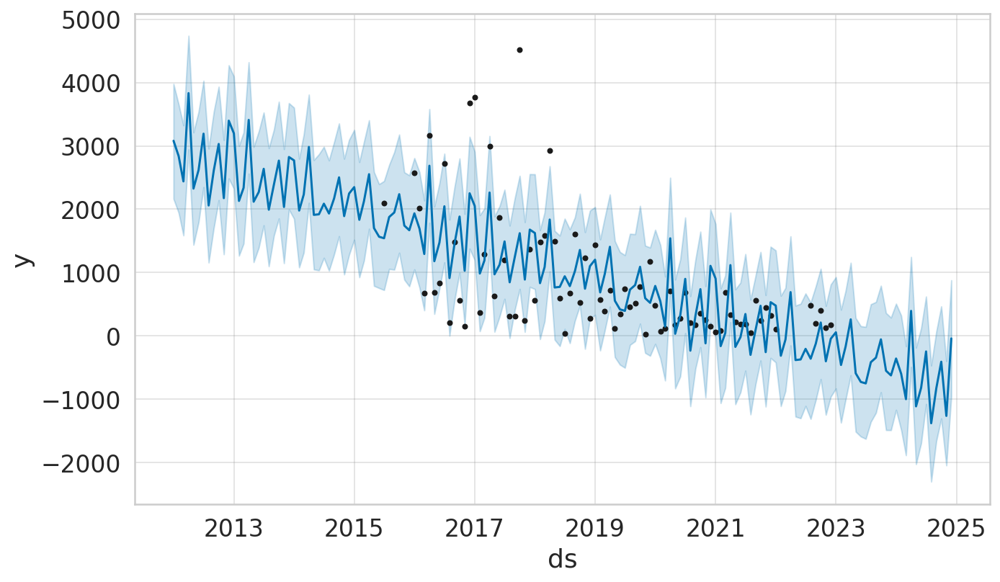

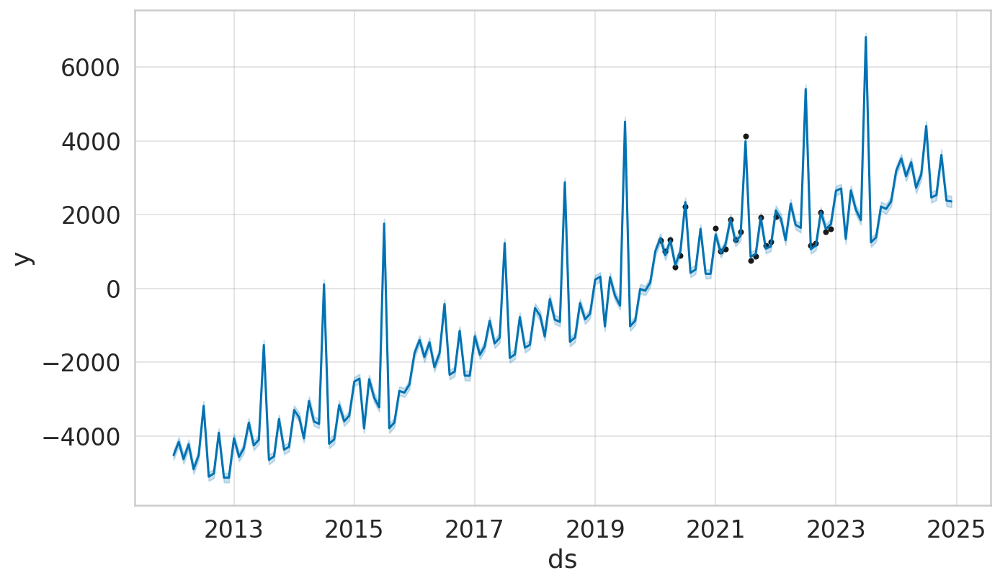

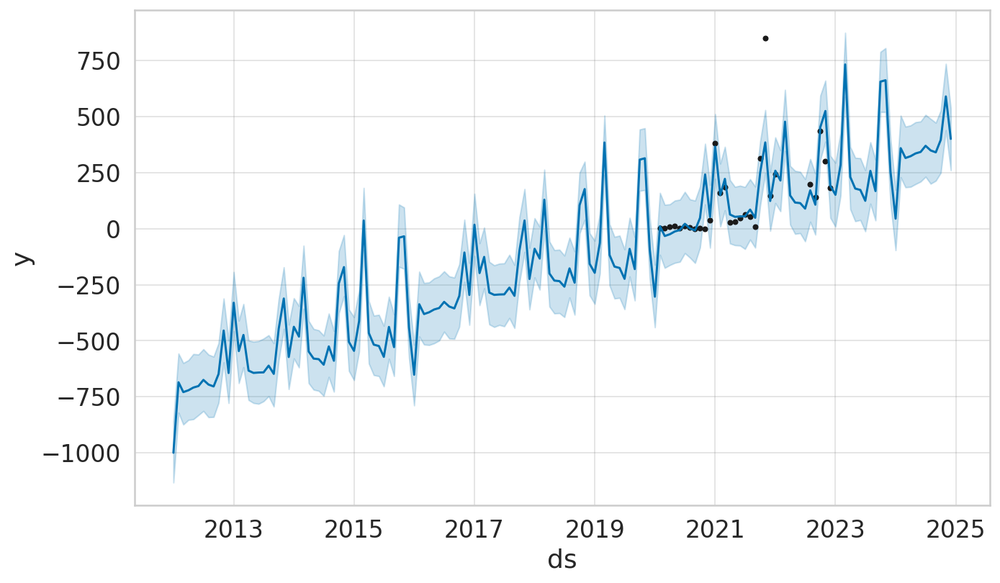

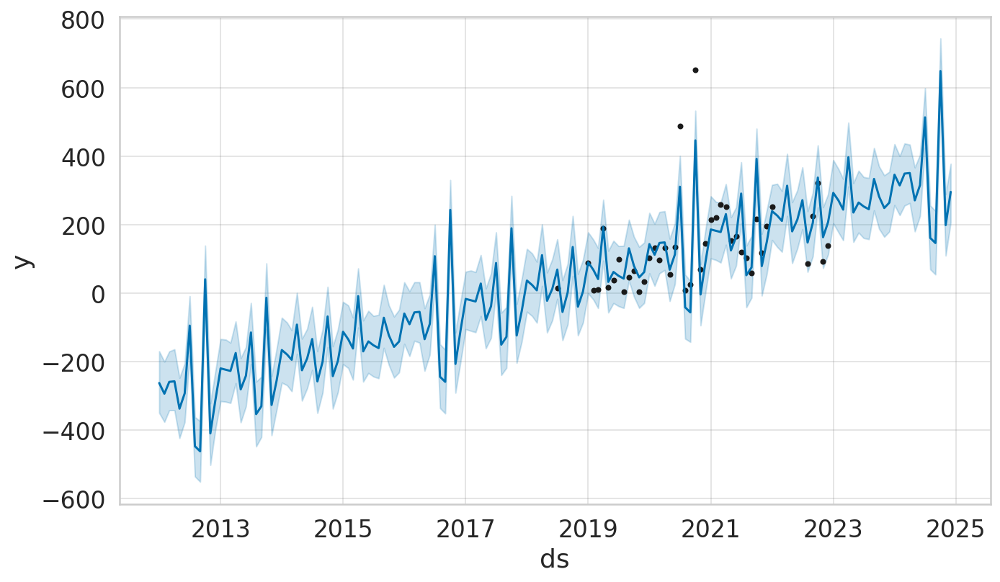

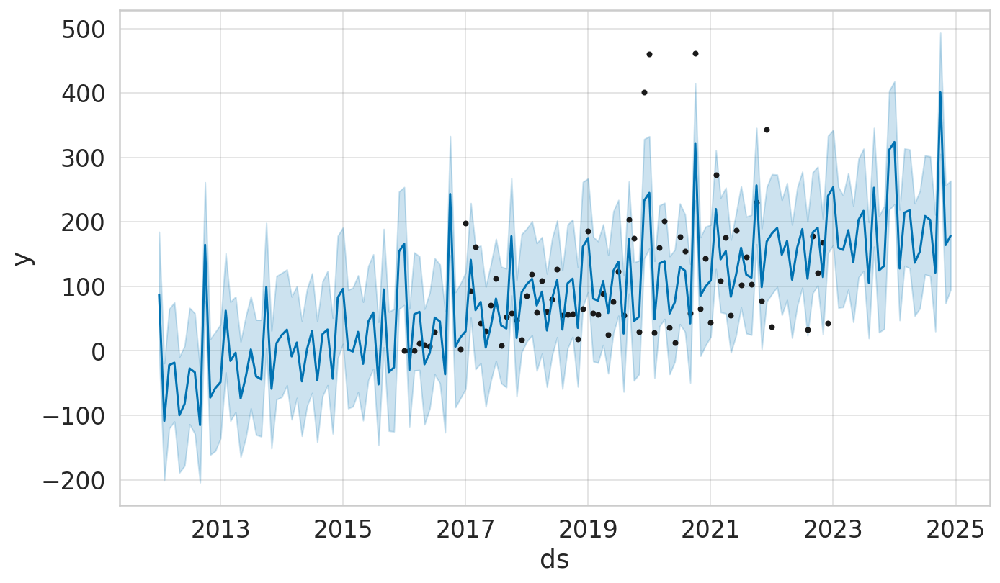

...

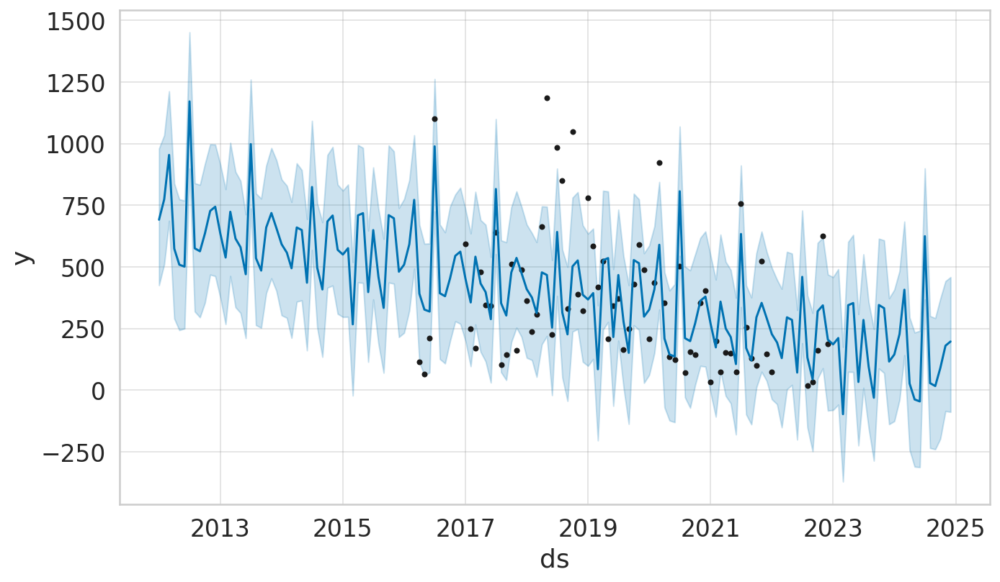

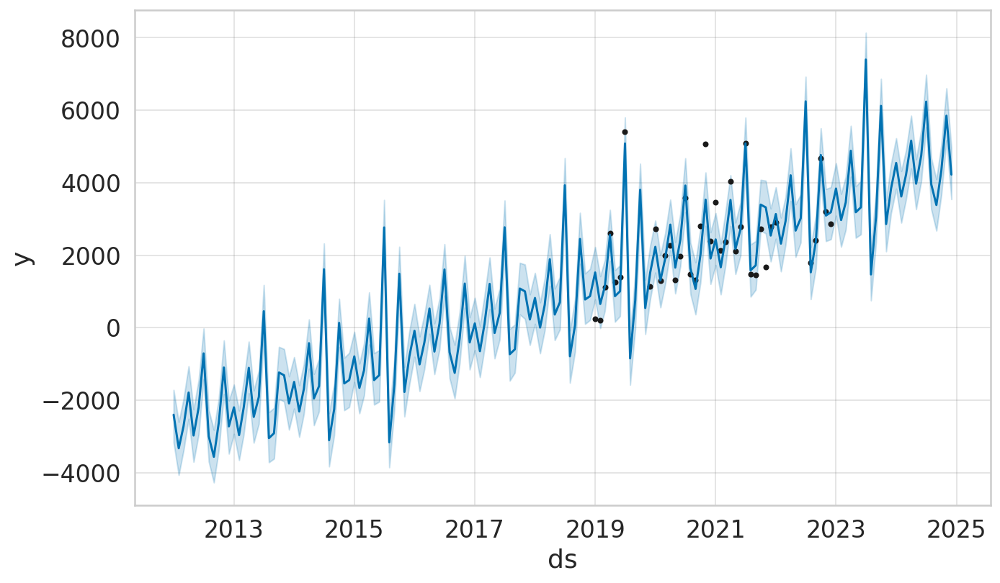

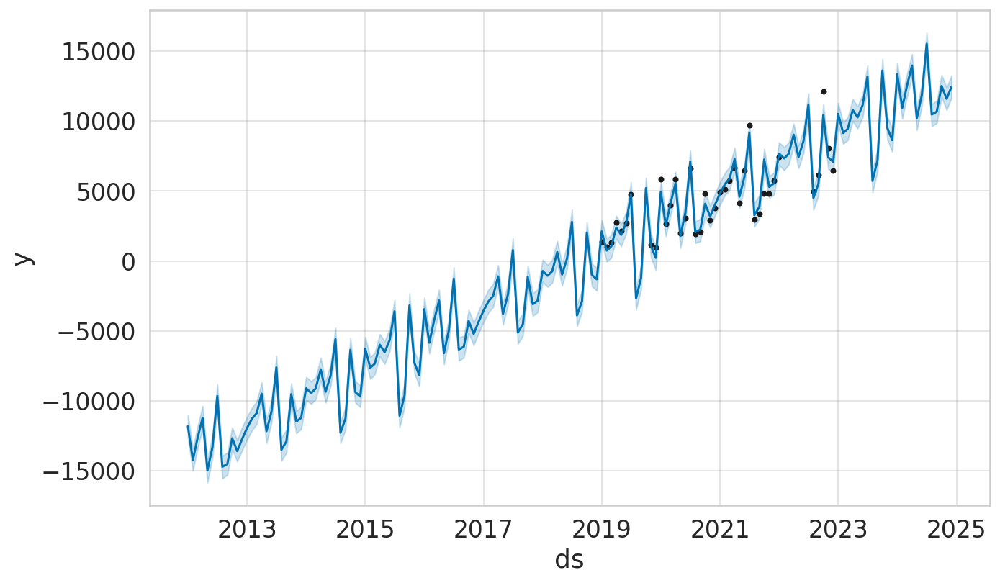

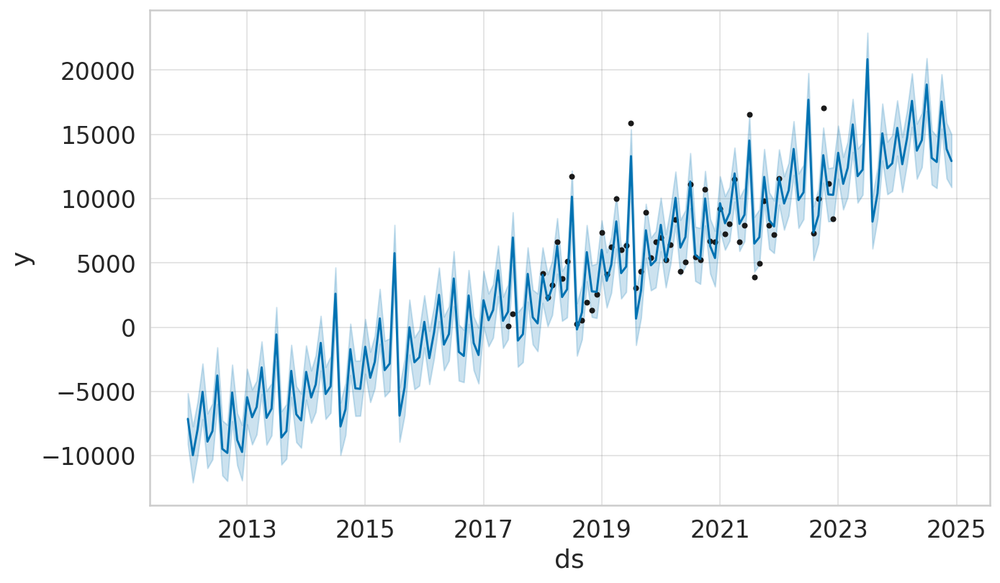

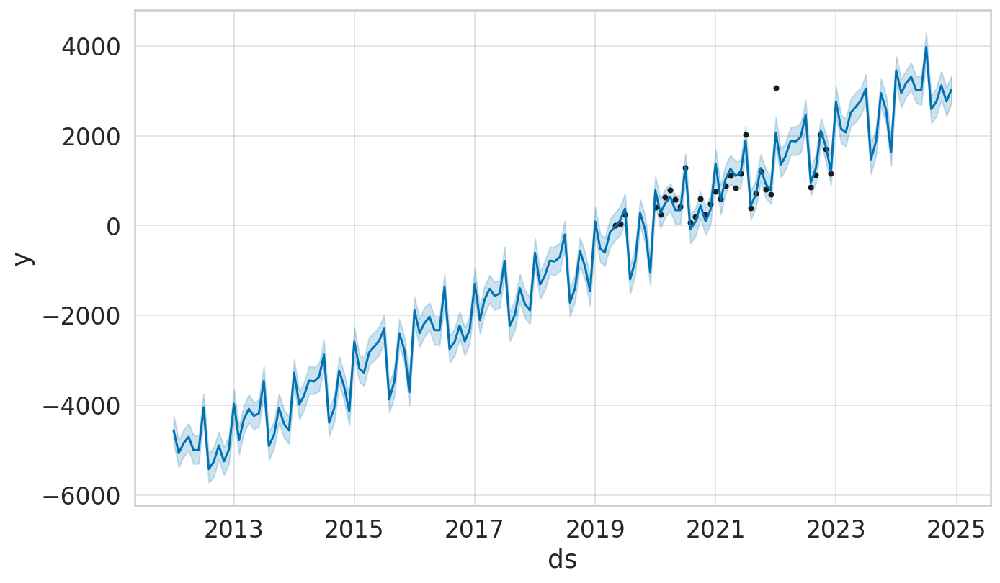

Error in callback <function flush_figures at 0x7fcc796acd30> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
# regressing by product family

num = {}
with open("numerifications.json", 'r') as f:
    num = json.load(f)

for i in range(no_fams):
    train_df = df.loc[df['product_family'] == i][["booking_date", "booked_qty"]]
    train_df.columns = ["ds", "y"]
    train_df = train_df.sort_values(by='ds')
    train_df = train_df.reset_index()
    train_df.drop("index", inplace = True, axis = 1)
    
    print("before mean:", train_df.shape)
    
    after_mean = train_df.groupby("ds")["y"].mean()
    after_mean = after_mean.reset_index()
    after_mean.columns = ["ds", 'y']

    print("after mean:", after_mean.shape)

    model = Prophet()
    model.fit(after_mean)


    # extrapolating output
    future = pd.DataFrame(pd.date_range(start='2012-01-01', end='2024-12-31', freq='MS'), columns = ["ds"])

    forecast = model.predict(future)

    # model.plot(forecast)

    # fam_name = num["Product Family"][str(i)]
    # plt.savefig(f"prophet_results/{str(fam_name)}.png")


In [ ]:
!zip -r prophet_results.zip prophet_results

updating: prophet_results/ (stored 0%)
updating: prophet_results/CTSPS.png (deflated 3%)
updating: prophet_results/CAT8300.png (deflated 5%)
updating: prophet_results/8000.png (deflated 3%)
updating: prophet_results/IE4000.png (deflated 3%)
updating: prophet_results/C9115AX.png (deflated 4%)
updating: prophet_results/C9120AX.png (deflated 4%)
updating: prophet_results/A9K1000.png (deflated 2%)
updating: prophet_results/NCS1000.png (deflated 3%)
updating: prophet_results/C9400.png (deflated 2%)
updating: prophet_results/NCS5500.png (deflated 2%)
updating: prophet_results/PHONVID.png (deflated 2%)
updating: prophet_results/HXCPU.png (deflated 3%)
updating: prophet_results/A9K9000.png (deflated 2%)
updating: prophet_results/NCS540.png (deflated 3%)
updating: prophet_results/NCS4200.png (deflated 4%)
updating: prophet_results/CAT8200.png (deflated 8%)
updating: prophet_results/CBR8.png (deflated 2%)
updating: prophet_results/SFP10G.png (deflated 3%)
updating: prophet_results/ONS.png (defla